<a href="https://colab.research.google.com/github/Tomtechno/IA-Poker/blob/main/2do_Parcial_IA21kDatasetFinalDescargado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



Imports



In [1]:
import torch
import os
from IPython.display import Image, clear_output, display  # para visualizar las imagenes
from google.colab import files # para importar el modelo
import glob

Clonamos Yolov5 e instalamos dependencias

In [2]:
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5
%pip install -qr requirements.txt 
%pip install -q roboflow

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14188, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 14188 (delta 28), reused 41 (delta 16), pack-reused 14130
Receiving objects: 100% (14188/14188), 13.53 MiB | 17.89 MiB/s, done.
Resolving deltas: 100% (9745/9745), done.
/content/yolov5
     |████████████████████████████████| 182 kB 38.8 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 1.6 MB 58.8 MB/s 
     |████████████████████████████████| 41 kB 579 kB/s 
     |████████████████████████████████| 138 kB 61.3 MB/s 
     |████████████████████████████████| 178 kB 68.8 MB/s 
     |████████████████████████████████| 67 kB 6.0 MB/s 
     |████████████████████████████████| 54 kB 2.8 MB/s 
     |████████████████████████████████| 145 kB 68.3 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


Clear ML para visualizacion

In [3]:
!pip install git+https://github.com/allegroai/clearml #visualizador de datos Clear ML
!pip install clearml-agent
! export MPLBACKEND=TkAg
from clearml import Task

Task.set_credentials(
     api_host="https://api.clear.ml", 
     web_host="https://app.clear.ml", 
     files_host="https://files.clear.ml", 
     key='Q18U9TUG2B3TQFRRB0HF', 
     secret='YZMarphJ9DwDzZu6viSRY6YGnnekDPmGik4ZyeYi4XMlI1k52E'
)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/allegroai/clearml to /tmp/pip-req-build-qupf5fcb
  Running command git clone -q https://github.com/allegroai/clearml /tmp/pip-req-build-qupf5fcb
  Created wheel for clearml: filename=clearml-1.8.1-py2.py3-none-any.whl size=958308 sha256=53441b7b60dce8f5e28f7137eaa3283a6fda58295064a8ea0fb4ad6023985c8c
  Stored in directory: /tmp/pip-ephem-wheel-cache-6q56r30t/wheels/18/ab/96/4ce7e38b3a4205d441b736200efb34d53ee932b6fb5aa7be1b
Successfully built clearml
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 378 kB 37.1 MB/s 
     |████████████████████████████████| 116 kB 65.8 MB/s 
     |████████████████████████████████| 8.8 MB 53.0 MB/s 
     |████████████████████████████████| 636 kB 68.5 MB/s 
     |████████████████████████████████| 49 kB 4.8 MB/s 
     |████████████████████████

Tomamos el dataset de Google Drive y lo descomprimimos

In [4]:
from google.colab import drive
drive.mount('/content/drive')
%cd
%ls
!unzip -q /content/drive/My\ Drive/datos_colab/cards.v2i.yolov5pytorch.zip -d/content/

Mounted at /content/drive
/root


In [5]:
%cd ../content/yolov5
%ls

/content/yolov5
benchmarks.py    detect.py   models/           setup.cfg       val.py
classify/        export.py   README.md         train.py
CONTRIBUTING.md  hubconf.py  requirements.txt  tutorial.ipynb
data/            LICENSE     segment/          utils/


In [10]:
!python train.py --freeze 10 --img 416 --batch 8 --epochs 60 --data /content/data.yaml --weights /content/drive/My\ Drive/datos_colab/best21kPoker.pt --cache  #en weights hay que elegir la version de yolo n,s,m,l,x

train: weights=/content/drive/My Drive/datos_colab/best21kPoker.pt, cfg=, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=60, batch_size=8, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[10], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_g

# Test

In [11]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/test/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-8-g350e8eb Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7150369 parameters, 0 gradients, 16.2 GFLOPs
image 1/85 /content/test/images/000554394_jpg.rf.7833e20bf764f8c46de566704bbcb6c0.jpg: 416x416 1 2c, 4 2hs, 1 8h, 2 8ss, 1 9h, 1 Ah, 8.4ms
image 2/85 /content/test/images/000807742_jpg.rf.b759bb3ab1a8de0e42fefa002a71666b.jpg: 416x416 1 2h, 1 8d, 4 Ahs, 3 Qss, 8.5ms
image 3/85 /content/test/images/001980363_jpg.rf.5560e433ac4b5cde8

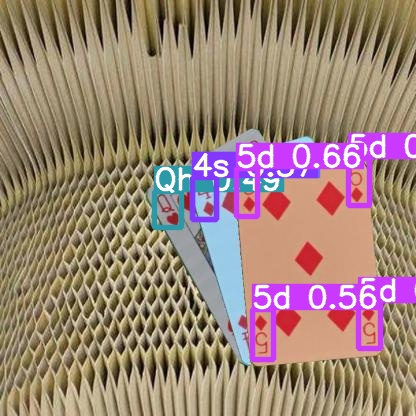

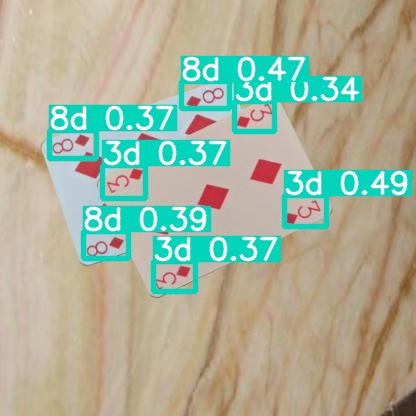

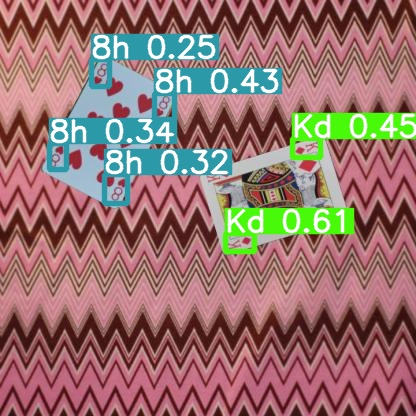

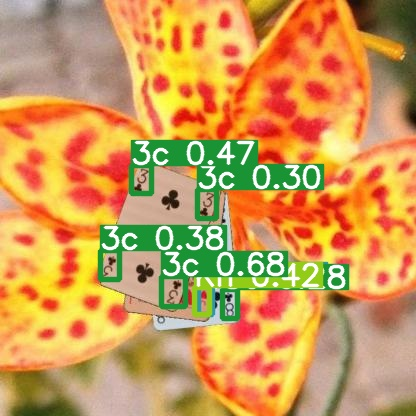

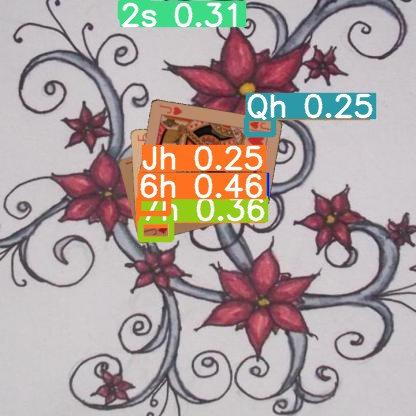

...

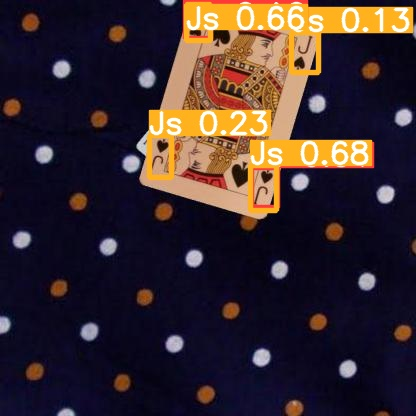

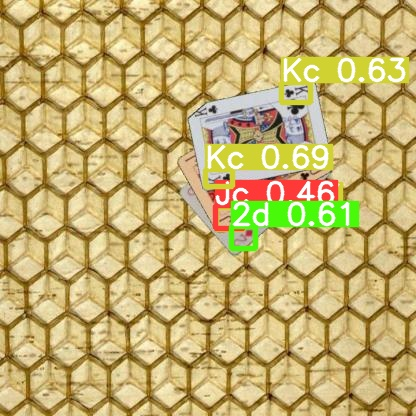

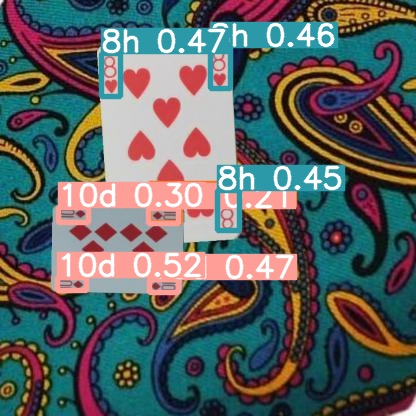

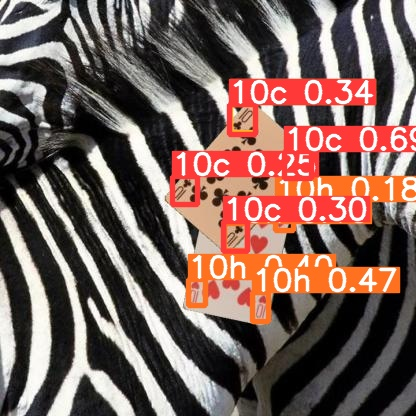

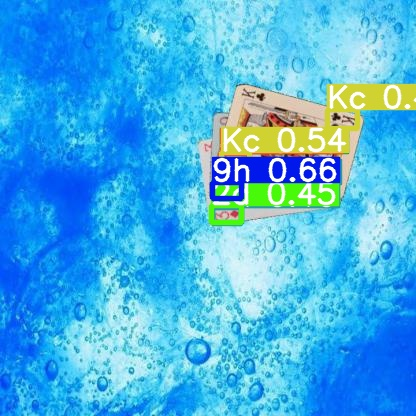

In [12]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# TensorBoard

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 583), started 0:39:53 ago. (Use '!kill 583' to kill it.)

<IPython.core.display.Javascript object>

# Exportar el modelo

In [ ]:
files.download('./runs/train/exp/weights/best.pt')
files.download('./runs/train/exp/weights/last.pt')
files.download('./runs')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [16]:
!apt-get install rar
!rar a "/content/compresion_ia" "/content/yolov5"

Reading package lists... Done
Building dependency tree       
Reading state information... Done
rar is already the newest version (2:5.5.0-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.

RAR 5.50   Copyright (c) 1993-2017 Alexander Roshal   11 Aug 2017
Trial version             Type 'rar -?' for help

Evaluation copy. Please register.

Creating archive /content/compresionFull_ia.rar

Adding    /content/yolov5/.git/index                                       0%  OK 
Adding    /content/yolov5/.git/info/exclude                                0%  OK 
Adding    /content/yolov5/.git/logs/HEAD                                   0%  OK 
Adding    /content/yolov5/.git/logs/refs/remotes/origin/HEAD               0%  OK 
Adding    /content/yolov5/.git/logs/refs/heads/master                      0%  OK